In [1]:
import numpy as np
import time, os, sys
from glob import glob
from tifffile import imread
from tqdm import tqdm
import pandas as pd

# from urllib.parse import urlparse
# import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
# mpl.rcParams['figure.dpi'] = 96
%config InlineBackend.figure_format = 'retina'

from cellpose import utils, models, transforms, dynamics, plot

import mxnet as mx
from mxnet import init, nd

%load_ext autoreload
%autoreload 2

%config IPCompleter.greedy=True

In [2]:
def plot_nd(arr, figsize=(15,15)):
    nd = len(arr)
    fig, axes = plt.subplots(ncols=nd, figsize=figsize)
    for img, ax in zip(arr, axes.flatten()):
        ax.imshow(img, cmap='gray')
    plt.show()

## Load dsb dataset

In [3]:
HOME = '/home/lis-paul'
PATH = "data/dsb2018/dsb2018_sub1/"
# PATH = "data/centuri/train/"
# path = os.path.join(HOME, "data/dsb2018/dsb2018_sub1/images/*.tif")
pathX = os.path.join(HOME, PATH+"images/*.tif")
pathY = os.path.join(HOME, PATH+"masks/*.tif")
X_file = sorted(glob(pathX))
Y_file = sorted(glob(pathY))
print(len(X_file), len(Y_file))

X = list(map(imread,X_file))
Y = list(map(imread,Y_file))
# n_channel = 1 if X[0].ndim == 2 else X[0].shape[-1]


292 292


In [4]:
rng = np.random.RandomState(42)
ind = rng.permutation(len(X))
n_val = max(1, int(round(0.15 * len(ind))))
ind_train, ind_val = ind[:-n_val], ind[-n_val:]

## manual assign train/val index for debugging
# ind_train = [1,2,3,4]
# ind_val = [0]

X_val, Y_val = [X[i] for i in ind_val]  , [Y[i] for i in ind_val]
X_trn, Y_trn = [X[i] for i in ind_train], [Y[i] for i in ind_train] 
print('number of images: %3d' % len(X))
print('- training:       %3d' % len(X_trn))
print('- validation:     %3d' % len(X_val))

number of images: 292
- training:       248
- validation:      44


## load default models

In [6]:
# _ = mx.ndarray.array([1, 2, 3], ctx=mx.gpu(0))

In [7]:
model0 = models.Cellpose(gpu=True, net_avg=False, batch_size=8, model_type='nuclei')
type(model0)

>>>> using GPU


cellpose.models.Cellpose

In [8]:
model0.cp.device, model0.cp.batch_size, model0.cp.diam_mean

(gpu(0), 8, 15.0)

In [9]:
model0.cp.pretrained_model, model0.pretrained_size

('/home/lis-paul/.cellpose/models/nuclei_0',
 '/home/lis-paul/.cellpose/models/size_nuclei_0.npy')

In [10]:
# train_data, test_data, run_test = transforms.reshape_data(X_trn, X_val, channels=[0,0])

In [11]:
X_val[0].shape, Y_val[0].shape

((256, 256), (256, 256))

## debug

In [144]:
unique(Y_trn[0])

array([ 0,  1,  2,  3,  4,  5,  6,  7,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 36, 37,
       38, 42, 43, 44, 45, 46, 47, 48, 49, 50], dtype=uint16)

In [145]:
flow, diam = dynamics.labels_to_flows2(Y_trn[:5])

NOTE: computing flows for labels (could be done before to save time)


In [146]:
diam

(43.02324952859791,
 43.12771730569565,
 23.65374998373612,
 30.347981810987037,
 12.569805089976535)

In [134]:
%matplotlib Qt5
import matplotlib.pyplot as plt
%matplotlib Qt5
mask = Y_trn[8]
plt.imshow(mask)

In [135]:
mu = dynamics.masks_to_flows2(mask)
plot_nd(mu)

## precalculate flow from labels

In [5]:
%%time
flow_trn2, diam_trn2 = dynamics.labels_to_flows2(Y_trn)
flow_val2, diam_val2 = dynamics.labels_to_flows2(Y_val)

NOTE: computing flows for labels (could be done before to save time)



NOTE: computing flows for labels (could be done before to save time)



CPU times: user 15.7 s, sys: 140 ms, total: 15.8 s
Wall time: 15.8 s


In [115]:
%%time
flow_trn = dynamics.labels_to_flows(Y_trn)
flow_val = dynamics.labels_to_flows(Y_val)

NOTE: computing flows for labels (could be done before to save time)



NOTE: computing flows for labels (could be done before to save time)



CPU times: user 23.8 s, sys: 0 ns, total: 23.8 s
Wall time: 23.8 s


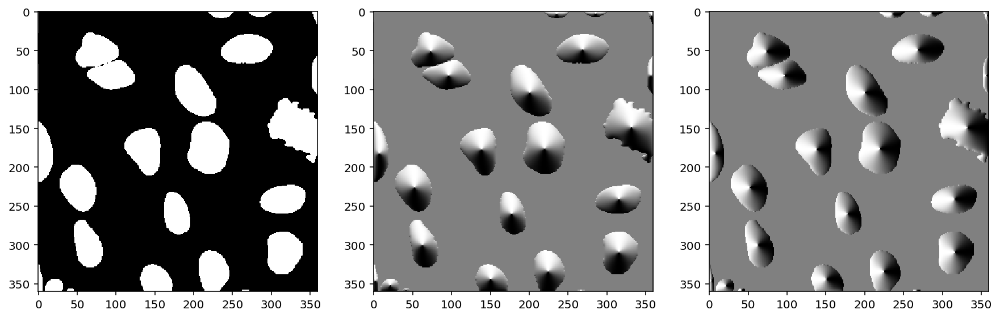

In [137]:
%matplotlib inline
plot_nd(flow_trn[8])

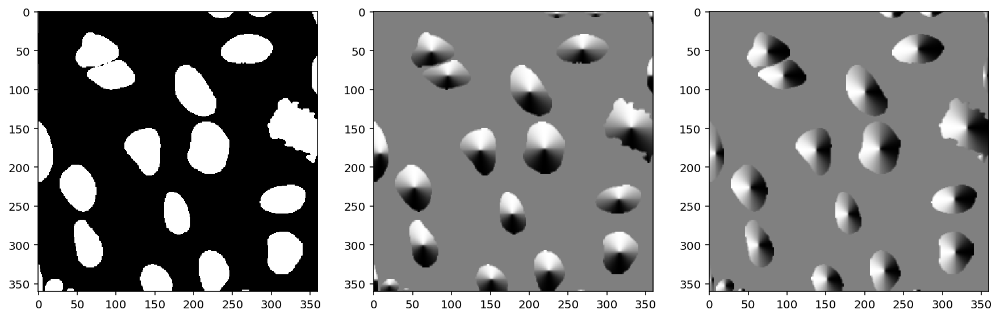

In [138]:
plot_nd(flow_trn2[8])

## visualize object size distribution in training and validation set

((array([70., 50.,  3., 34., 13.,  1.,  3., 27., 42.,  5.]),
  array([ 8.21533113, 12.49869763, 16.78206412, 21.06543062, 25.34879711,
         29.6321636 , 33.9155301 , 38.19889659, 42.48226308, 46.76562958,
         51.04899607]),
  <a list of 10 Patch objects>),
 21.071307505705477)

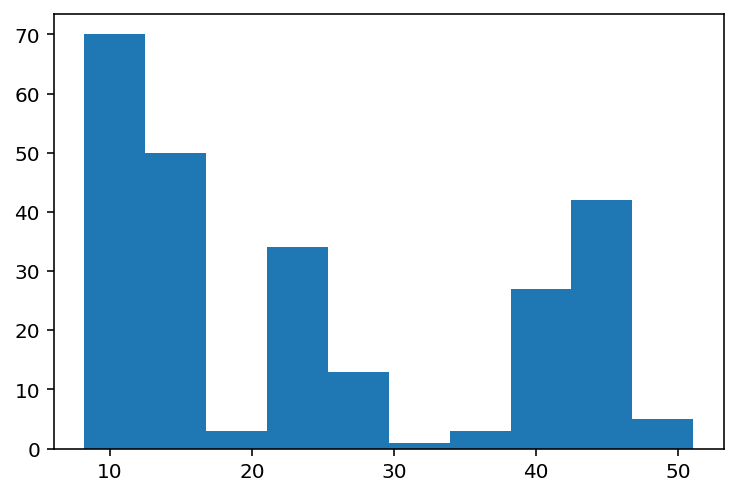

In [6]:
plt.hist(diam_trn2), np.median(diam_trn2)

((array([10.,  9.,  3.,  1.,  3.,  0.,  0.,  0.,  6., 12.]),
  array([ 8.30662386, 12.10844736, 15.91027085, 19.71209435, 23.51391784,
         27.31574134, 31.11756483, 34.91938833, 38.72121182, 42.52303532,
         46.32485882]),
  <a list of 10 Patch objects>),
 20.115539505281163)

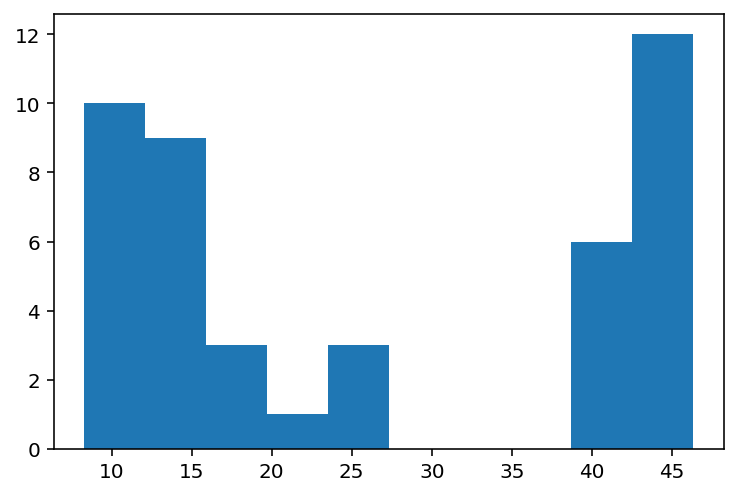

In [7]:
plt.hist(diam_val2), np.median(diam_val2)

In [39]:
from cellpose import lr_schedular

def plot_schedule(schedule_fn, iterations=1500):
    # Iteration count starting at 1
    iterations = [i+1 for i in range(iterations)]
    lrs = [schedule_fn(i) for i in iterations]
    plt.plot(iterations, lrs)
    plt.xlabel("Iteration")
    plt.ylabel("Learning Rate")
#     plt.yscale('log')
    plt.show()

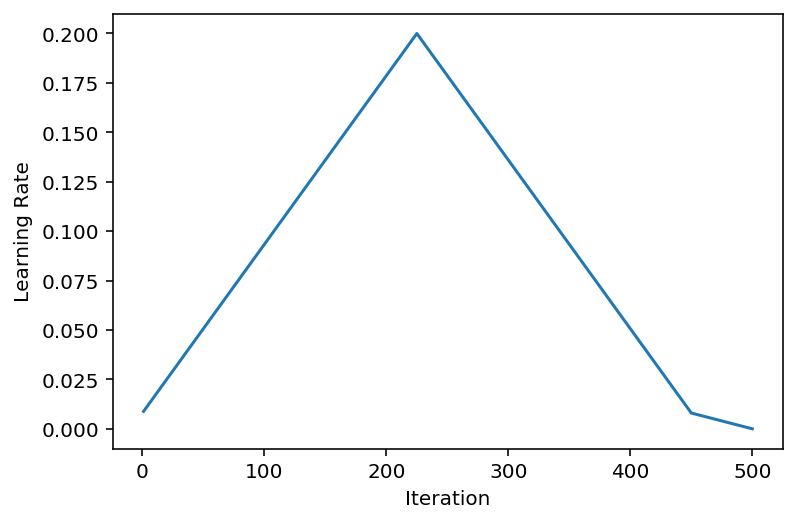

In [42]:
epochs = 500
schedule = lr_schedular.OneCycleSchedule(start_lr=0.2/25, max_lr=0.2, cycle_length=epochs*0.9, cooldown_length=epochs*0.1, finish_lr=1e-3*0.2/25)
plot_schedule(schedule, epochs)

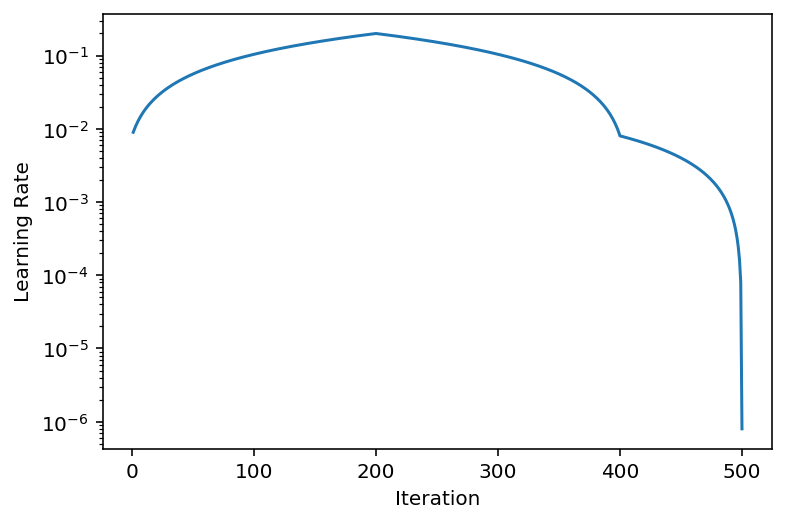

In [35]:
epochs = 500
schedule = lr_schedular.OneCycleSchedule(start_lr=0.2/25, max_lr=0.2, cycle_length=400, cooldown_length=100, finish_lr=1e-4*0.2/25)
plot_schedule(schedule, epochs)

## train from scratch using GDT without rescaling

In [6]:
cpnet = models.CellposeModel(gpu=True, diam_mean=20.0, batch_size=8, pretrained_model=False, device=mx.gpu(), net_avg=False, unet=False)
cpnet.device

gpu(0)

In [7]:
cpnet.net.initialize(init=init.Xavier(rnd_type='uniform', factor_type='in', magnitude=2), force_reinit=True, ctx = cpnet.device)

In [7]:
history2 = cpnet.train(X_trn, Y_trn, test_data=X_val, test_labels=Y_val, channels=[0,0], train_flows=flow_trn2, test_flows=flow_val2,
              pretrained_model=None, save_path='../fresh_gdt_dsb', save_every=100, 
              learning_rate=0.2, n_epochs=500, weight_decay=0.00001, batch_size=8, rescale=False)

>>>> training network with 2 channel input <<<<
>>>> saving every 100 epochs
>>>> median diameter = 20
>>>> LR: 0.20000, batch_size: 8, weight_decay: 0.00001
>>>> ntrain = 248
>>>> ntest = 44
Epoch 0, Time 13.964445352554321 LR 0.0000
Trainfl 0.1945 Trainpl 0.6413 Testfl 0.1193 Testpl 0.6426
Loss 0.8358 Test_Loss 0.7619
Epoch 1, Time 22.83042287826538 LR 0.0222
Trainfl 0.0362 Trainpl 0.2090 Testfl 0.0198 Testpl 0.0609
Loss 0.2452 Test_Loss 0.0807
saving network parameters to: ../fresh_gdt_dsb/models/cellpose_False_fresh_gdt_dsb_2020_05_26_20_59_31.456819
Epoch 2, Time 31.58643078804016 LR 0.0444
Trainfl 0.0123 Trainpl 0.0455 Testfl 0.0137 Testpl 0.0417
Loss 0.0578 Test_Loss 0.0554
Epoch 3, Time 40.41362023353577 LR 0.0667
Trainfl 0.0093 Trainpl 0.0346 Testfl 0.0125 Testpl 0.0344
Loss 0.0440 Test_Loss 0.0469
Epoch 4, Time 49.16252517700195 LR 0.0889
Trainfl 0.0087 Trainpl 0.0329 Testfl 0.0111 Testpl 0.0342
Loss 0.0415 Test_Loss 0.0453
Epoch 5, Time 57.94273805618286 LR 0.1111
Trainfl 0.

In [ ]:
history = cpnet.train(X_trn, Y_trn, test_data=X_val, test_labels=Y_val, channels=[0,0], train_flows=flow_trn2, test_flows=flow_val2,
              pretrained_model=None, save_path='../fresh_gdt_dsb/sgdm_onecycle', save_every=100, 
              learning_rate=0.2, n_epochs=500, weight_decay=0.001, batch_size=8, rescale=False)

>>>> training network with 2 channel input <<<<
>>>> saving every 100 epochs
>>>> median diameter = 20
>>>> LR: 0.20000, batch_size: 8, weight_decay: 0.00100
>>>> ntrain = 248
>>>> ntest = 44
Epoch 0, Time 14.166027069091797 LR 0.0080
Trainfl 0.1945 Trainpl 0.6413 Testfl 0.1193 Testpl 0.6426
Loss 0.8358 Test_Loss 0.7619
Epoch 1, Time 22.93919086456299 LR 0.0089
Trainfl 0.0493 Trainpl 0.3165 Testfl 0.0232 Testpl 0.1280
Loss 0.3658 Test_Loss 0.1512
saving network parameters to: ../fresh_gdt_dsb/sgdm_onecycle/models/cellpose_False_sgdm_onecycle_2020_05_27_14_59_40.732790
Epoch 2, Time 32.08621859550476 LR 0.0097
Trainfl 0.0163 Trainpl 0.0873 Testfl 0.0178 Testpl 0.0636
Loss 0.1036 Test_Loss 0.0814
Epoch 3, Time 40.94095420837402 LR 0.0106
Trainfl 0.0130 Trainpl 0.0539 Testfl 0.0151 Testpl 0.0509
Loss 0.0669 Test_Loss 0.0659
Epoch 4, Time 49.80962157249451 LR 0.0114
Trainfl 0.0121 Trainpl 0.0474 Testfl 0.0177 Testpl 0.0452
Loss 0.0595 Test_Loss 0.0628
Epoch 5, Time 58.68886923789978 LR 0.0

In [9]:
df = pd.DataFrame(data=history, columns=['epoch', 'train_loss', 'val_loss', 'train_flowloss', 'train_probloss',
                                         'val_flowloss', 'val_probloss', 'LR'])

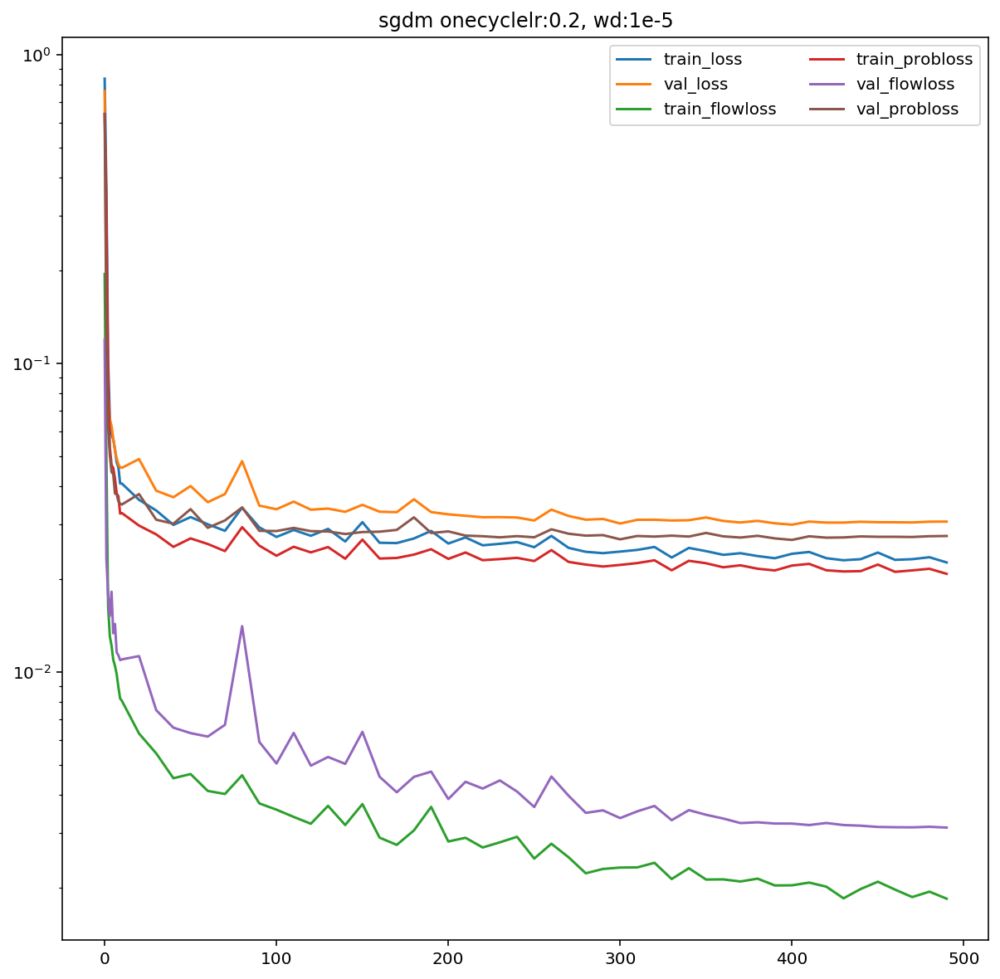

In [11]:
cols = ['train_loss', 'val_loss', 'train_flowloss', 'train_probloss', 'val_flowloss', 'val_probloss']

plt.figure(figsize=(10,10))
for c in cols:
    plt.plot(df.epoch, df[c], label=c)
plt.title('sgdm onecyclelr:0.2, wd:1e-5')
plt.yscale('log')
plt.legend(loc=1, ncol=2)
plt.show()

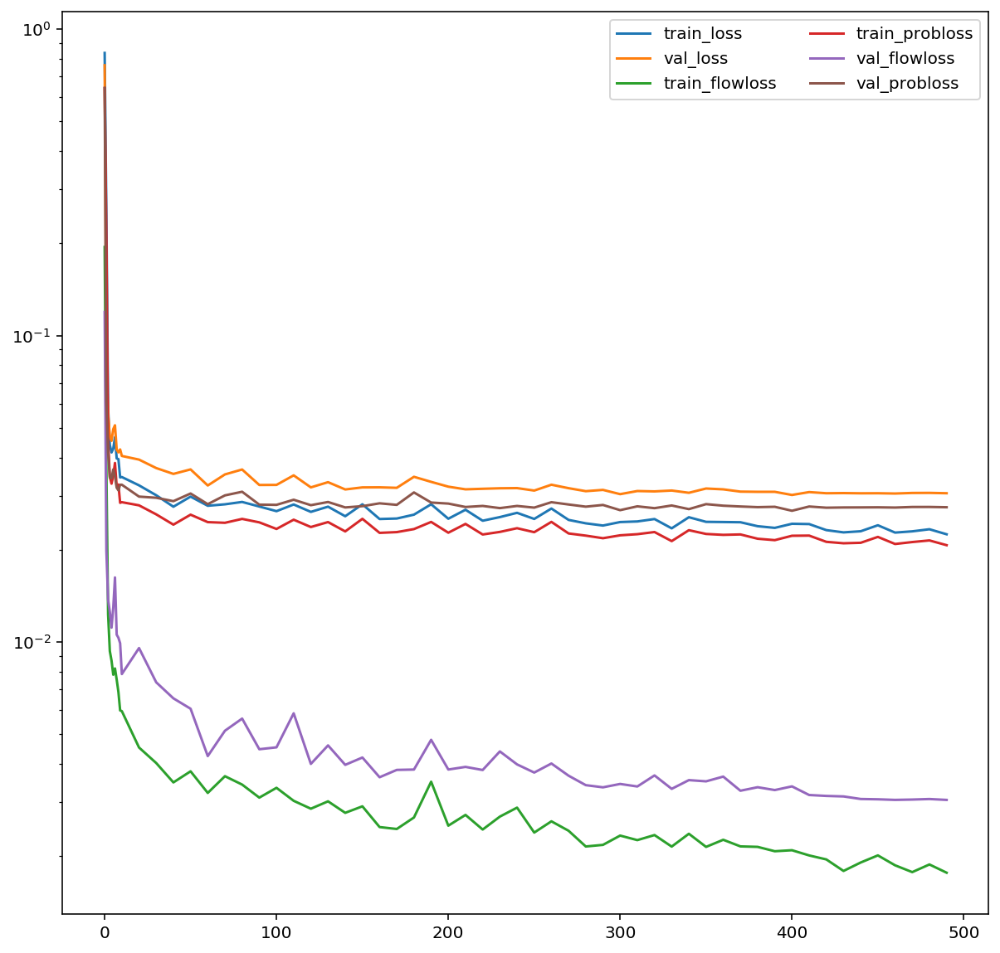

In [10]:
cols = ['train_loss', 'val_loss', 'train_flowloss', 'train_probloss', 'val_flowloss', 'val_probloss']

plt.figure(figsize=(10,10))
for c in cols:
    plt.plot(df.epoch, df[c], label=c)

plt.yscale('log')
plt.legend(loc=1, ncol=2)
plt.show()

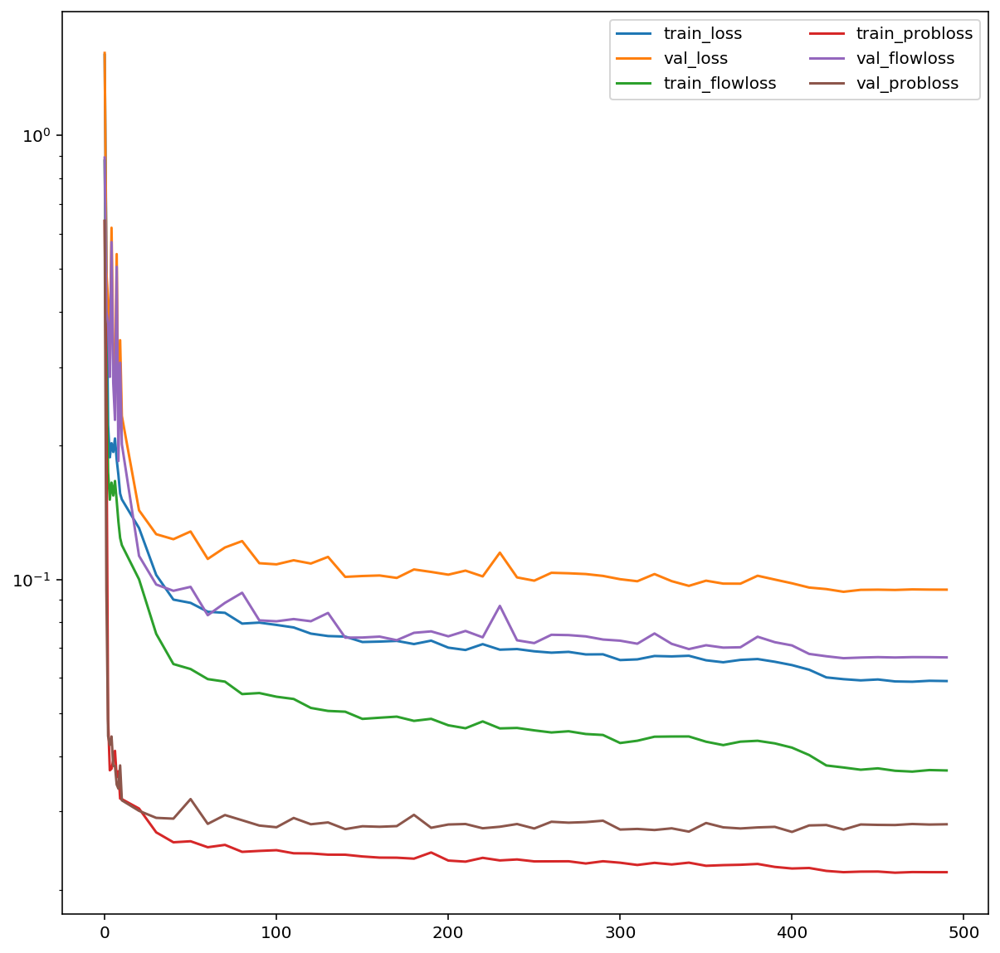

In [25]:
cols = ['train_loss', 'val_loss', 'train_flowloss', 'train_probloss', 'val_flowloss', 'val_probloss']

plt.figure(figsize=(10,10))
for c in cols:
    plt.plot(df.epoch, df[c], label=c)

plt.yscale('log')
plt.legend(loc=1, ncol=2)
plt.show()

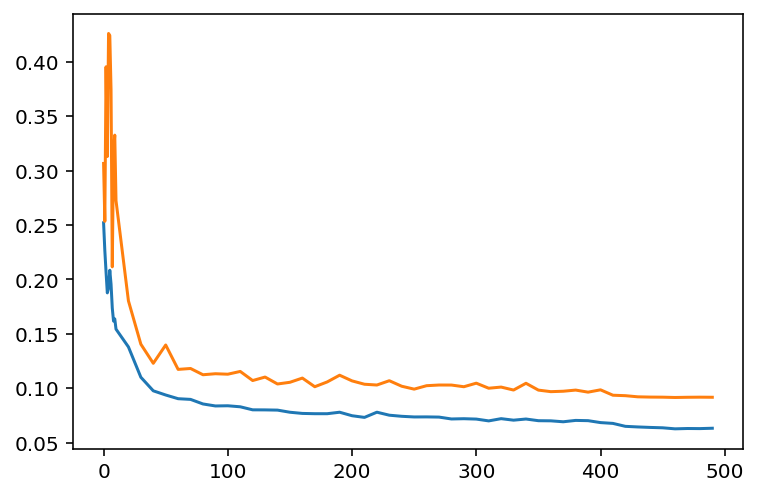

In [25]:
plt.plot(df.epoch, df.train_loss)
plt.plot(df.epoch, df.val_loss)
plt.show()

### visualize prediction with trained model

In [27]:
np.ones(len(X_val))

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [11]:
## nuclei diam = 60, rescale = 15/60 = 0.25
masks, flows, styles = cpnet.eval(X_val, channels=[0,0], invert=False, rescale=np.ones(len(X_val)), do_3D=False, net_avg=False, 
                                  tile=True, flow_threshold=99, cellprob_threshold=0.0, compute_masks=True, progress=None)

100%|██████████| 44/44 [00:24<00:00,  1.78it/s]


In [12]:
idx = [0,1,2,3,4,6,31]

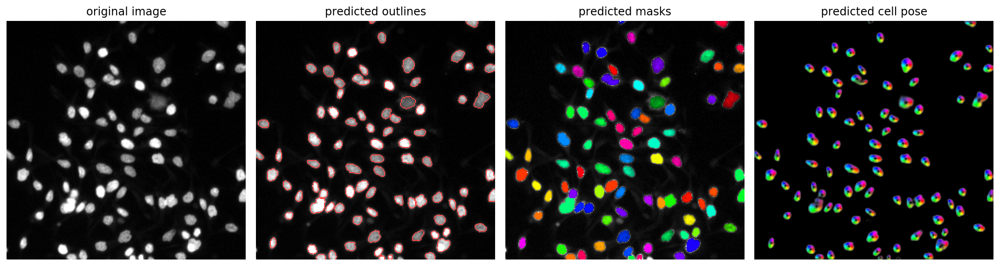

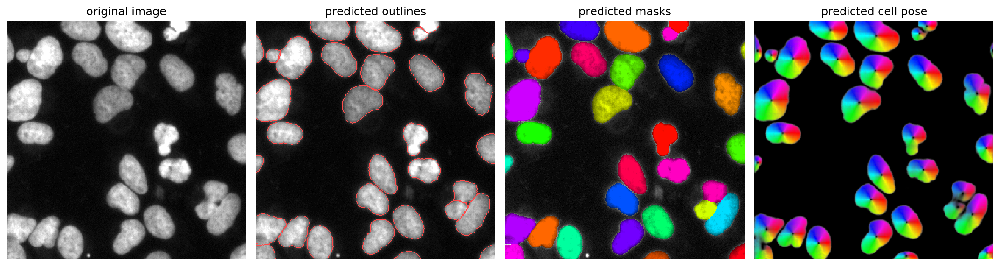

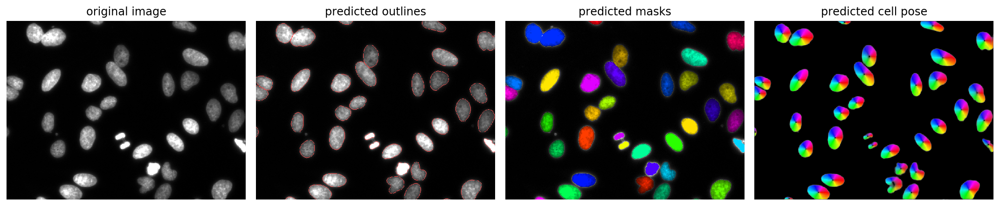

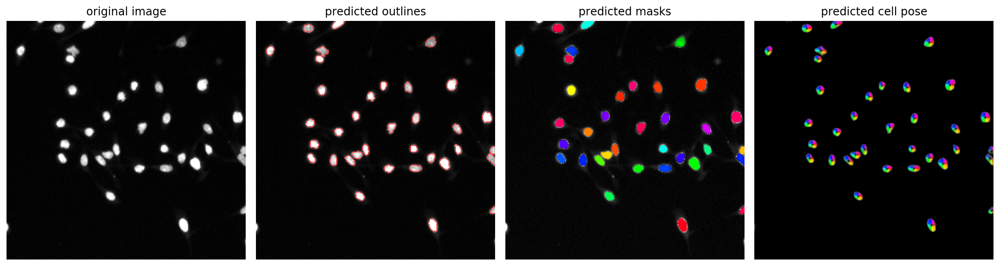

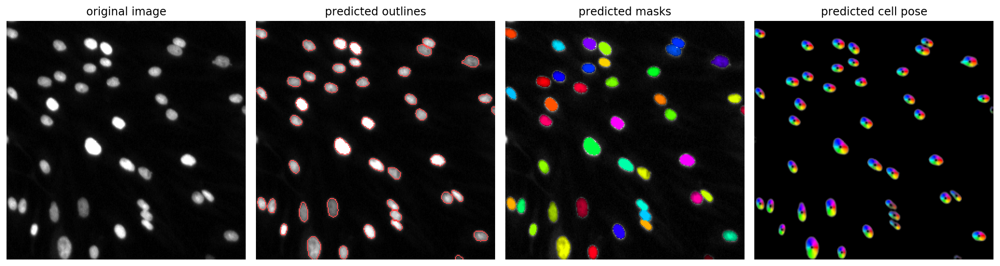

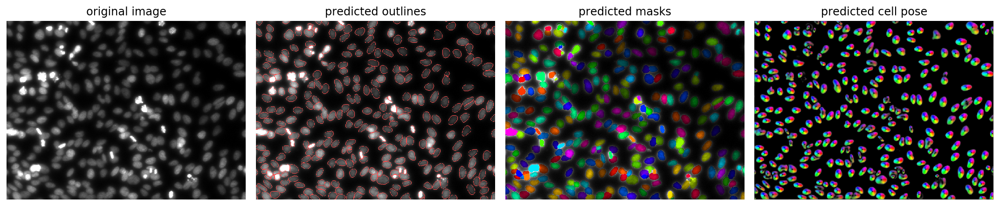

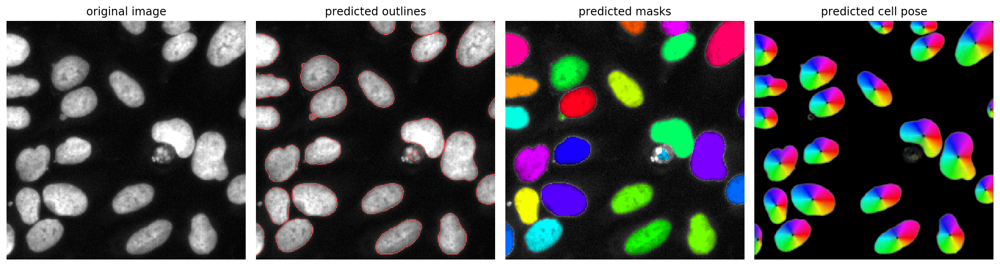

In [13]:
for i in idx:
    fig = plt.figure(figsize=(15,15))
    plot.show_segmentation(fig, X_val[i], masks[i], flows[i][0], channels=[0,0])
    plt.tight_layout()
    plt.show()

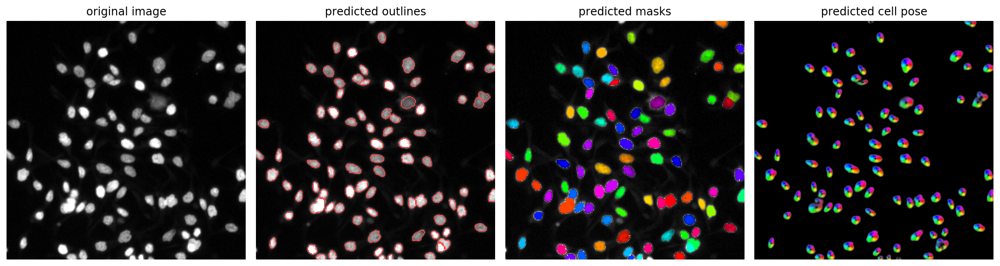

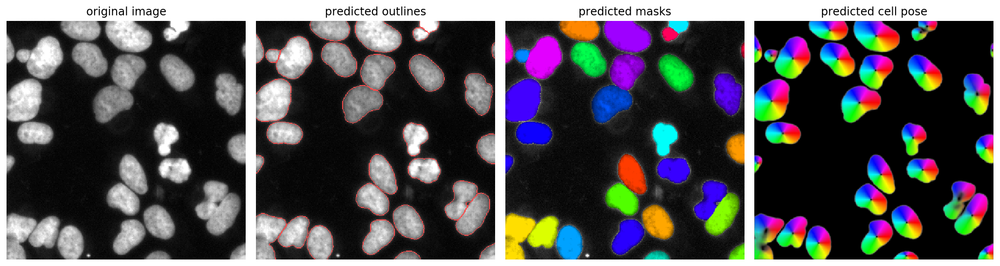

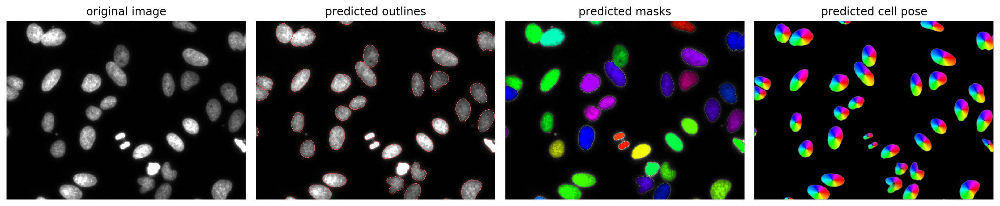

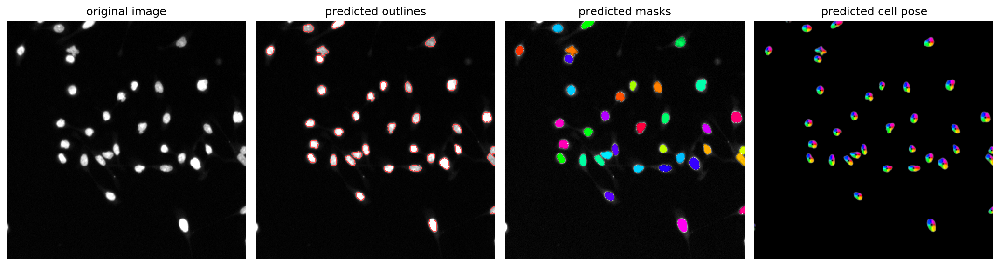

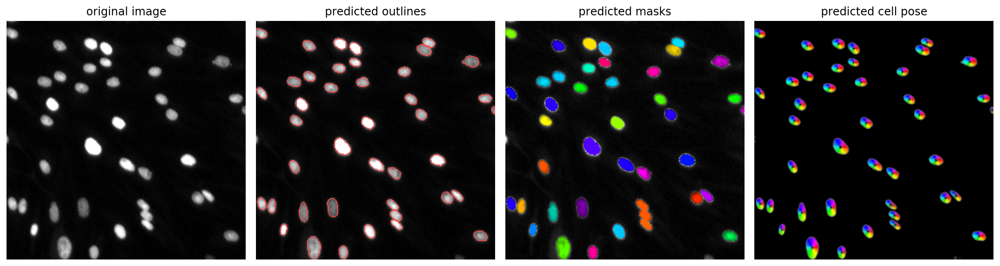

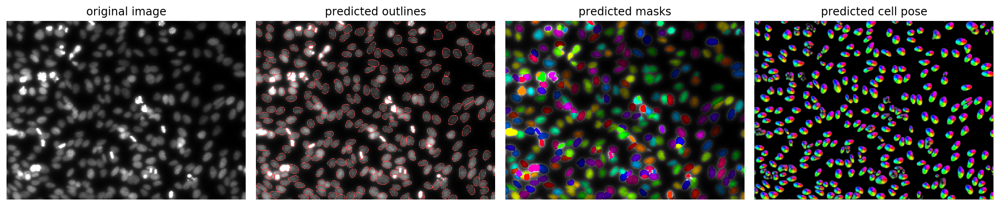

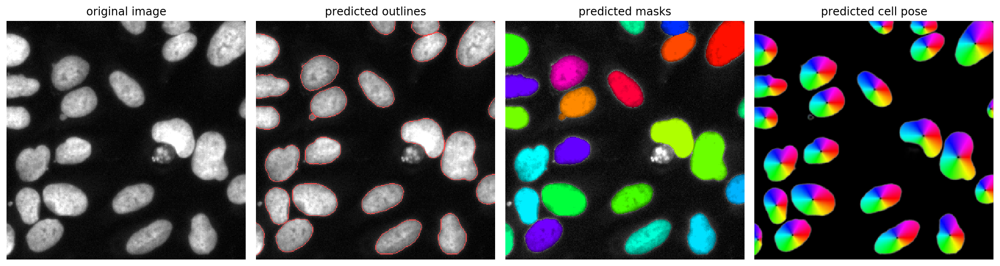

In [31]:
for i in idx:
    fig = plt.figure(figsize=(15,15))
    plot.show_segmentation(fig, X_val[i], masks[i], flows[i][0], channels=[0,0])
    plt.tight_layout()
    plt.show()

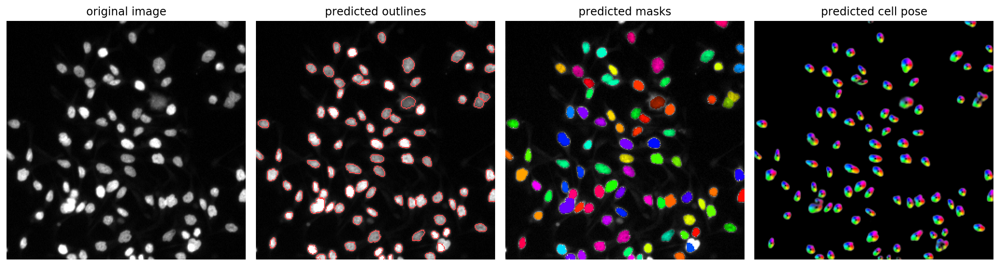

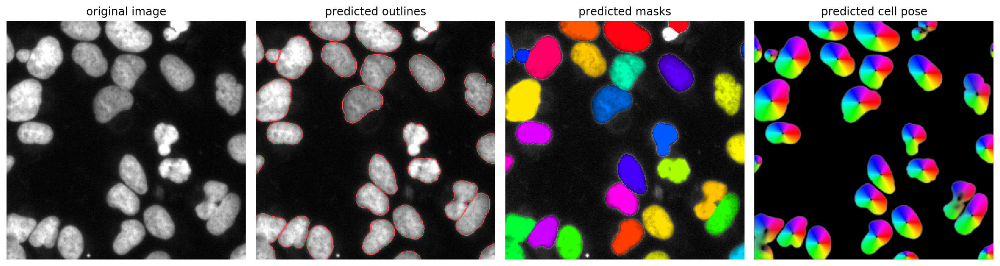

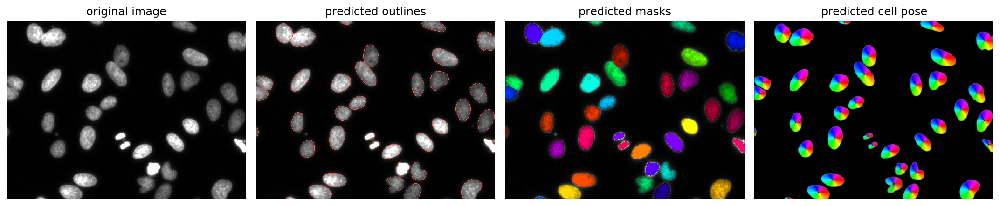

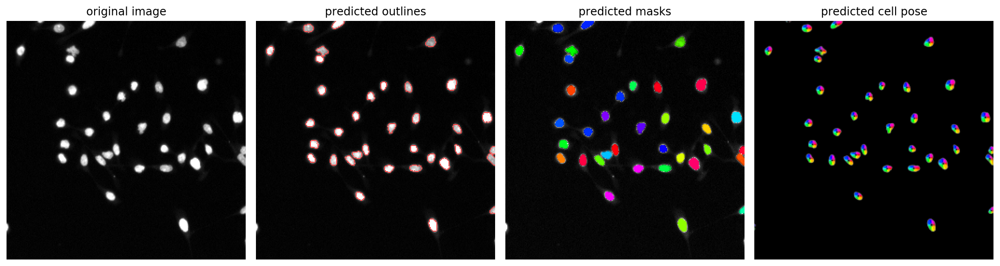

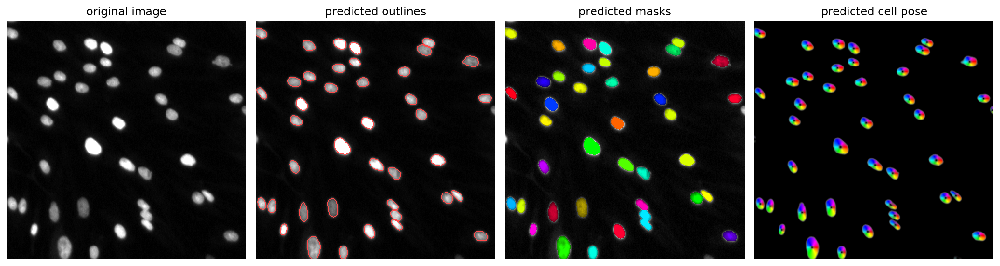

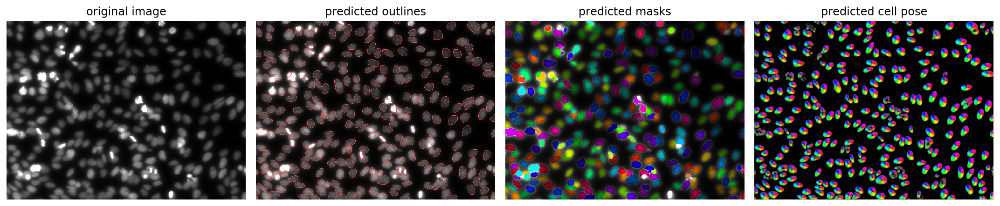

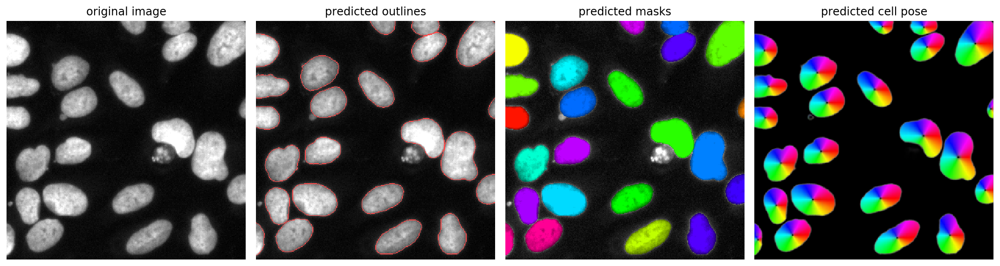

In [29]:
for i in idx:
    fig = plt.figure(figsize=(15,15))
    plot.show_segmentation(fig, X_val[i], masks[i], flows[i][0], channels=[0,0])
    plt.tight_layout()
    plt.show()

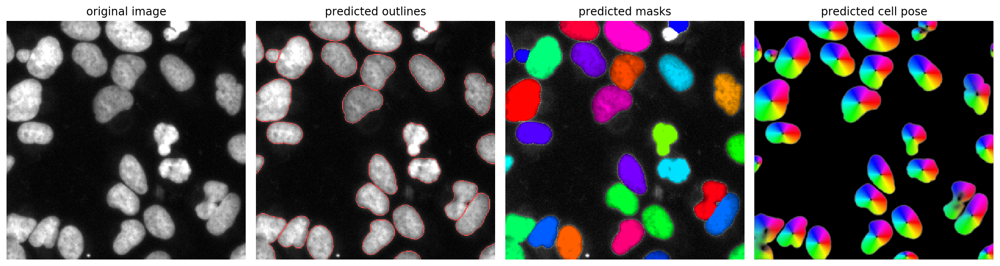

In [27]:
i=1
fig = plt.figure(figsize=(15,15))
plot.show_segmentation(fig, X_val[i], masks[i], flows[i][0], channels=[0,0])
plt.tight_layout()
plt.show()

In [38]:
masks2, flows2, styles2 = cpnet2.eval(X_val, channels=[0,0], invert=False, rescale=0.25, do_3D=False, net_avg=False, 
                                  tile=False, flow_threshold=0.4, cellprob_threshold=0.0, compute_masks=True, progress=None)

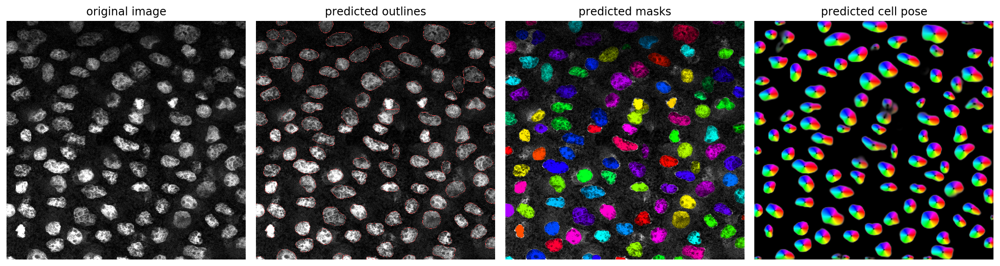

In [39]:
fig = plt.figure(figsize=(15,15))
plot.show_segmentation(fig, X_val[0], masks2[0], flows2[0][0], channels=[0,0])
plt.tight_layout()
plt.show()

### visualize transformed/augmented img/labels 

In [38]:
lbl[0].shape, imgi[0].shape

((3, 224, 224), (2, 224, 224))

In [49]:
arrs = [np.concatenate([i[[0]], l]) for l, i in zip(lbl, imgi)]
len(arrs), arrs[0].shape

(4, (4, 224, 224))

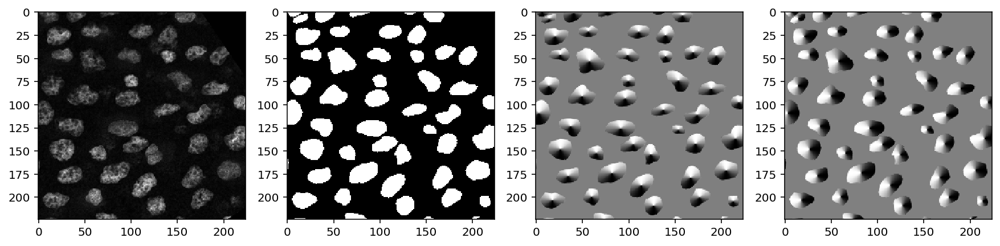

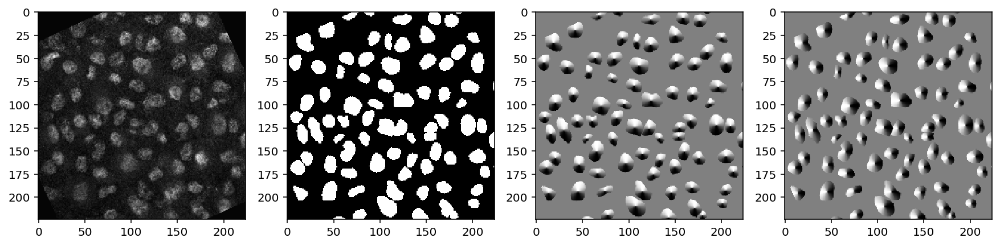

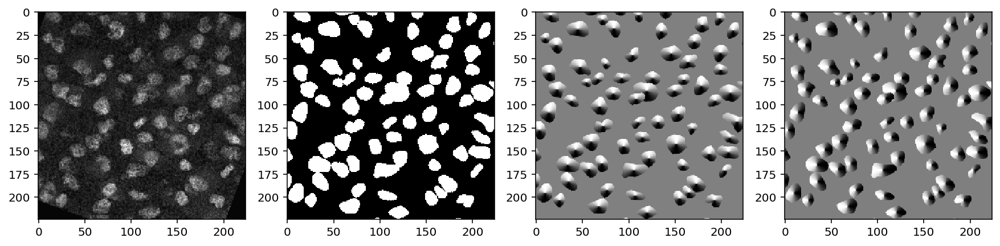

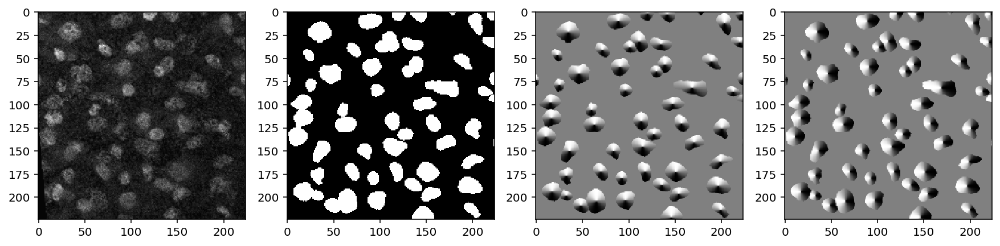

In [53]:
for l in arrs:
    plot_nd(l, nd=4)

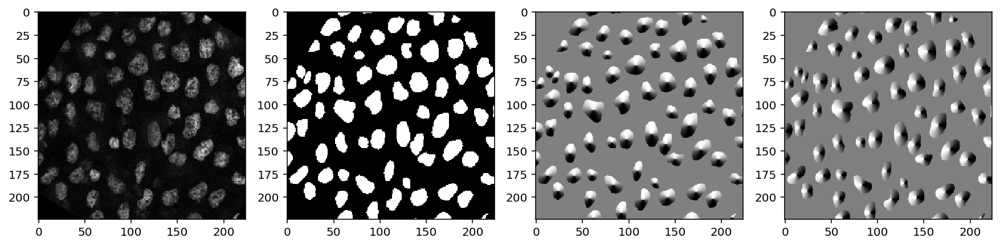

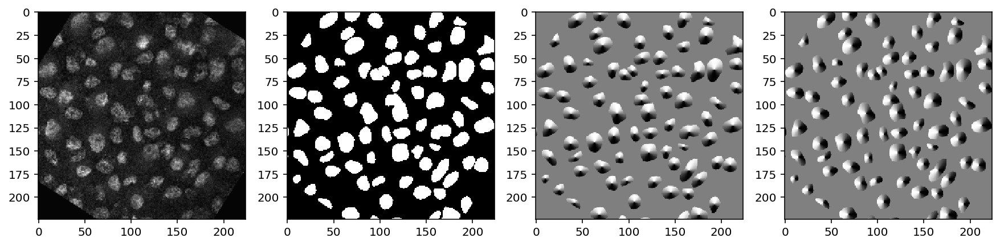

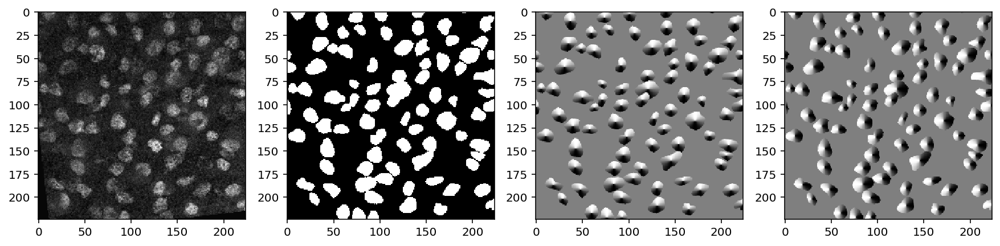

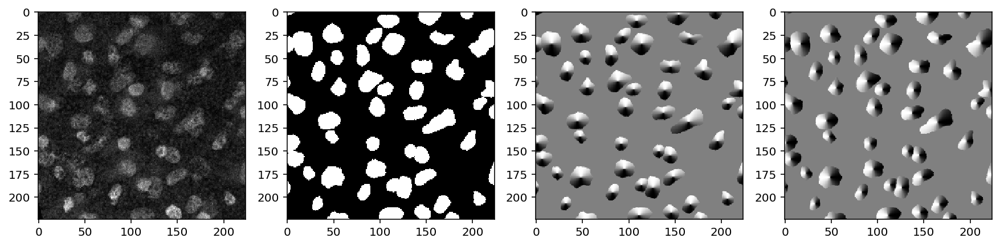

In [56]:
arrs = [np.concatenate([i[[0]], l]) for l, i in zip(lbl, imgi)]
for l in arrs:
    plot_nd(l, nd=4)

### load trained model parameters

In [36]:
# path = '../models/cellpose_False__2020_05_25_17_04_11.191577'
path = '../models/cellpose_False__2020_05_25_17_39_37.432746'
cpnet2 = models.CellposeModel(gpu=True, diam_mean=15.0, batch_size=8, pretrained_model=path, device=model0.cp.device, net_avg=False, unet=False)


In [34]:
model0.cp.net.downsample.down[0].conv[0][2].weight.data()[0]


[[[ 0.04114713  0.0824549   0.5053643 ]
  [-0.10932951 -0.87627375 -0.20008686]
  [ 0.20691864 -0.23023081  0.08594982]]

 [[-0.01360054  0.00572765 -0.00556034]
  [ 0.02173528  0.0197194   0.00890682]
  [-0.00245167 -0.0068812   0.00553805]]]
<NDArray 2x3x3 @gpu(0)>

In [37]:
cpnet2.net.downsample.down[0].conv[0][2].weight.data()[0]


[[[-0.04261043 -0.01184517  0.39662385]
  [-0.16004884 -0.90654963 -0.27657637]
  [ 0.13281374 -0.287448    0.01202662]]

 [[-0.01349027  0.00568122 -0.00551528]
  [ 0.02155902  0.01955957  0.0088346 ]
  [-0.0024318  -0.00682541  0.00549316]]]
<NDArray 2x3x3 @gpu(0)>

In [25]:
cpnet2.net.downsample.down[0].conv[0][2].weight.data()[0]


[[[-0.03321636  0.01613303  0.40410134]
  [-0.15363842 -0.9065523  -0.26584458]
  [ 0.13819715 -0.28483343  0.01356527]]

 [[-0.01349027  0.00568122 -0.00551528]
  [ 0.02155902  0.01955957  0.0088346 ]
  [-0.0024318  -0.00682541  0.00549316]]]
<NDArray 2x3x3 @gpu(0)>